In [1]:
import torch
import numpy as np
import random
from models import *
import matplotlib.pyplot as plt
from diffusers import LMSDiscreteScheduler, DDIMScheduler, AutoencoderKL
from utils import *
import timeit
import h5py

from interpolation_baselines.C_space import *
from evaluation import *
from ddim import *
from Cebra import cebra_model

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")
# To the GPU we go!
vae = vae.to(device)


# The noise scheduler
noise_scheduler = LMSDiscreteScheduler(
    beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000
)

In [2]:
# Load Data
M = 9 

labels_raw = np.load('data/raw_labels_{}.npy'.format(M))
Z_data = np.load('data/ddim_latents_{}.npy'.format(M))
ca_labels = np.load('data/norm_labels_{}.npy'.format(M))

cebra_model.fit(Z_data,ca_labels)
C_data = cebra_model.transform(Z_data)

labels = ca_labels[:,1]
num_frames = len(labels)

pos:  2.9062 neg: -3.2424 total: -0.3362


In [3]:
# Lerp and Slerp vectors
steps = len(Z_data)
linspace_np = np.linspace(0, 1, steps)[:, np.newaxis].astype(np.float32)
t_values = linspace_np  # Interpolation steps

z1 = C_data[0]
z2 = C_data[-1]

lerp_vectors = lerp(z1, z2, t_values)
slerp_vectors = slerp(z1, z2, t_values)

# print(lerp_vectors.shape)
# print(slerp_vectors.shape)

In [4]:
# Prediction from Taylor's Expansion
Z = C_data             # shape (T, D)
dt = float(labels[1] - labels[0])

dz  = first_derivative(Z, dt)      # (T, D)
ddz = second_derivative(Z, dt)     # (T, D)

# One-step-ahead Taylor-predictions (cannot predict beyond last index)
tex1_pred = np.empty_like(Z)
tex1_pred[0] = Z[0]

tex2_pred = np.empty_like(Z)
tex2_pred[0] = Z[0]

for k in range(Z.shape[0] - 1):
    tex1_pred[k+1] = predict_next_latent_taylor1(Z[k], dz[k], dt)
    tex2_pred[k+1] = predict_next_latent_taylor2(Z[k], dz[k], ddz[k], dt)


In [5]:
# Spline interpolation (works only for dim < 11)
spline_curve, tck, u_new = spline_interpolation(
    C_data,
    s=0.0
)

In [6]:
# For LSTM training
number_list = list(range(6200))
train_block_size = 55
test_block_size = 7
num_blocks = 100
train_blocks = [number_list[i * (train_block_size+test_block_size)  : (i + 1) * train_block_size + test_block_size*i] 
                for i in range(num_blocks)]
test_blocks = [number_list[(i + 1) * train_block_size + test_block_size*i : (i+1)*(train_block_size + test_block_size)]
               for i in range(num_blocks)]  
idx_train = []
idx_test = []
for j in range(num_blocks):
    idx_train = idx_train + train_blocks[j]
    idx_test = idx_test + test_blocks[j]

print("Train:", len(idx_train), "Test:", len(idx_test))

# Convert inputs to tensors
latent_codes = torch.tensor(C_data[idx_train], dtype=torch.float32)  
time_labels = torch.tensor(labels[idx_train], dtype=torch.float32)  

# prepare sequences
input_seqs, target_seqs, time_seqs = prepare_sequences(latent_codes, time_labels)

# Combine into a dataset
dataset = TensorDataset(input_seqs, target_seqs, time_seqs)

# Split dataset: 80% training, 20% testing
train_size = int(0.8 * len(dataset))
train_dataset, test_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64)

model = TimeConditionedLatentLSTM(latent_dim=3, hidden_dim=128)
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()

Train: 5500 Test: 700


In [7]:
# Number of epochs
num_epochs = 500

# Lists to store losses for visualization or analysis later
train_losses = []
test_losses = []

for epoch in range(num_epochs):
    model.train()
    total_train_loss = 0

    for latent_codes, future_latents, time_labels in train_loader:
        optimizer.zero_grad()
        
        # Ensure time_labels has the shape (batch_size, seq_len, 1)
        time_labels = time_labels.unsqueeze(-1)
        
        # Forward pass
        output = model(latent_codes, time_labels)
        
        # Compute training loss
        train_loss = criterion(output, future_latents)
        train_loss.backward()
        optimizer.step()

        total_train_loss += train_loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Evaluation
    model.eval()
    total_test_loss = 0

    with torch.no_grad():
        for latent_codes, future_latents, time_labels in test_loader:
            time_labels = time_labels.unsqueeze(-1)
            output = model(latent_codes, time_labels)
            test_loss = criterion(output, future_latents)
            total_test_loss += test_loss.item()

    avg_test_loss = total_test_loss / len(test_loader)
    test_losses.append(avg_test_loss)
    if (epoch + 1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}]  Train Loss: {avg_train_loss:.4f}  Test Loss: {avg_test_loss:.4f}")


Epoch [10/500]  Train Loss: 512.1026  Test Loss: 485.0735
Epoch [20/500]  Train Loss: 333.6617  Test Loss: 316.4064
Epoch [30/500]  Train Loss: 219.6108  Test Loss: 208.3860
Epoch [40/500]  Train Loss: 143.1910  Test Loss: 136.1155
Epoch [50/500]  Train Loss: 91.9257  Test Loss: 88.3083
Epoch [60/500]  Train Loss: 58.6611  Test Loss: 56.9511
Epoch [70/500]  Train Loss: 37.1117  Test Loss: 36.4634
Epoch [80/500]  Train Loss: 23.3888  Test Loss: 23.3302
Epoch [90/500]  Train Loss: 14.7313  Test Loss: 14.9729
Epoch [100/500]  Train Loss: 9.4137  Test Loss: 9.6981
Epoch [110/500]  Train Loss: 6.1484  Test Loss: 6.4881
Epoch [120/500]  Train Loss: 4.1635  Test Loss: 4.4048
Epoch [130/500]  Train Loss: 2.9104  Test Loss: 3.0376
Epoch [140/500]  Train Loss: 2.1643  Test Loss: 2.1331
Epoch [150/500]  Train Loss: 1.6150  Test Loss: 1.6085
Epoch [160/500]  Train Loss: 1.3067  Test Loss: 1.2638
Epoch [170/500]  Train Loss: 1.1198  Test Loss: 1.0805
Epoch [180/500]  Train Loss: 0.9920  Test Loss: 

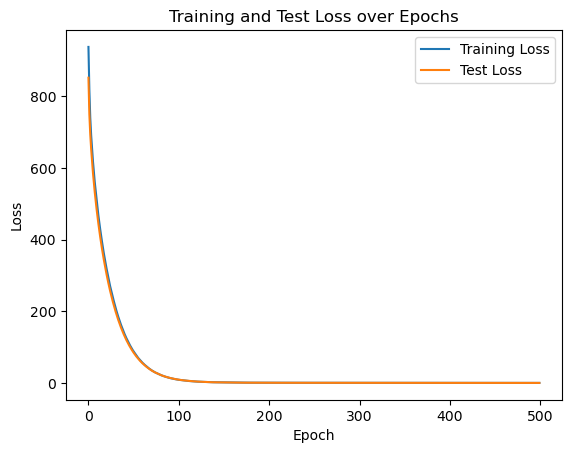

In [8]:
# Optional: Visualize the losses
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Test Loss over Epochs')
plt.show()

In [9]:
model.eval() 

latent_codes = torch.tensor(C_data).type(torch.float) #Re=120
time_labels = torch.tensor(labels).type(torch.float)

pred_output = []
mse_loss = nn.MSELoss()
for t in idx_test:
    if t <20:
        out = latent_codes[t:t+1]
    else:   
        out = model(latent_codes[t-20:t].unsqueeze(0), (time_labels[t-20:t].unsqueeze(0)).unsqueeze(-1))
        out = out.squeeze(1)
    pred_output.append(out)
    
    loss = mse_loss(latent_codes[t:t+1].unsqueeze(0),out)
    # print(loss.item())
lstm_output = torch.stack(pred_output).squeeze(1)
print(lstm_output.shape)

/athena/grosenicklab/scratch/sar4018/miniconda3/envs/embedding_env/lib/python3.9/site-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([1, 3])) that is different to the input size (torch.Size([1, 1, 3])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


torch.Size([700, 3])


In [10]:
print('RMSE')
# Trajectories are sampled at the same times (pointwise L2)
import numpy as np
def rmse_pointwise(X, Y):  # X,Y: (T,dim) with same T
    return np.sqrt(np.mean(np.sum((X - Y)**2, axis=1)))

rmse_lerp = rmse_pointwise(latent_codes[idx_test].detach().numpy(), lerp_vectors[idx_test])
print('Lerp:',rmse_lerp)

rmse_slerp = rmse_pointwise(latent_codes[idx_test].detach().numpy(), slerp_vectors[idx_test])
print('Slerp:',rmse_slerp)

rmse_lstm = rmse_pointwise(latent_codes[idx_test].detach().numpy(), lstm_output.detach().numpy())
print('LSTM:',rmse_lstm)

rmse_tex1 = rmse_pointwise(latent_codes[idx_test].detach().numpy(), tex1_pred[idx_test])
print('TEX-1:', rmse_tex1)

rmse_tex2 = rmse_pointwise(latent_codes[idx_test].detach().numpy(), tex2_pred[idx_test])
print('TEX-2:', rmse_tex2)    

rmse_spline = rmse_pointwise(latent_codes[idx_test].detach().numpy(), spline_curve[idx_test])
print('Spline:', rmse_spline)    

RMSE
Lerp: 34.292683
Slerp: 35.074482
LSTM: 1.263581
TEX-1: 0.4378575
TEX-2: 2.3975106e-06
Spline: 8.81041477344297e-15


In [11]:
# kNN decoding
import cebra

decoder = cebra.KNNDecoder(n_neighbors = 1, metric="euclidean")
decoder.fit(C_data, Z_data)

high_dim_lerp = decoder.predict(lerp_vectors[idx_test])
print('Lerp r2',decoder.score(lerp_vectors[idx_test], Z_data[idx_test]))

high_dim_slerp = decoder.predict(slerp_vectors[idx_test])
print('Slerp r2',decoder.score(slerp_vectors[idx_test], Z_data[idx_test]))

high_dim_lstm = decoder.predict(lstm_output.detach().numpy())
print('LSTM r2',decoder.score(lstm_output.detach().numpy(), Z_data[idx_test]))

high_dim_tex1 = decoder.predict(tex1_pred[idx_test])
print('TEX-1 r2',decoder.score(tex1_pred[idx_test], Z_data[idx_test]))

high_dim_tex2 = decoder.predict(tex2_pred[idx_test])
print('TEX-2 r2',decoder.score(tex2_pred[idx_test], Z_data[idx_test]))

high_dim_spline = decoder.predict(spline_curve[idx_test])
print('TEX-2 r2',decoder.score(spline_curve[idx_test], Z_data[idx_test]))

H_lerp = high_dim_lerp.reshape(len(idx_test),4,32,32)
H_slerp = high_dim_slerp.reshape(len(idx_test),4,32,32)
H_lstm = high_dim_lstm.reshape(len(idx_test),4,32,32)
H_tex1 = high_dim_tex1.reshape(len(idx_test),4,32,32)
H_tex2 = high_dim_tex2.reshape(len(idx_test),4,32,32)
H_spline = high_dim_spline.reshape(len(idx_test),4,32,32)

Lerp r2 -0.9500201940536499
Slerp r2 -0.9533493518829346
LSTM r2 -0.17891186475753784
TEX-1 r2 0.8150686025619507
TEX-2 r2 1.0
TEX-2 r2 1.0


In [12]:
niters = 50000
save_models_folder = 'output/saved_models'

Filename_LDM = save_models_folder + '/CcLDM_checkpoint_intrain/CcLDM_checkpoint_niters_{}.pth'.format(niters)
print("Loading pre-trained continuous conditional latent diffusion model >>>")
checkpoint = torch.load(Filename_LDM, map_location=device, weights_only=True)
netLDM = cont_cond_unet_diffusion_model().to(device)
netLDM = nn.DataParallel(netLDM)

# Adjust checkpoint keys if necessary
checkpoint_state_dict = checkpoint['netLDM_state_dict']
adjusted_state_dict = {}

for key, value in checkpoint_state_dict.items():
    # Replace naming inconsistencies
    new_key = key.replace("query", "to_q").replace("key", "to_k").replace("value", "to_v").replace("proj_attn", "to_out.0")
    adjusted_state_dict[new_key] = value

# Load the adjusted state dict
netLDM.load_state_dict(adjusted_state_dict, strict=True)

Loading pre-trained continuous conditional latent diffusion model >>>


<All keys matched successfully>

In [13]:
X_data = np.load('data/X_data_{}.npy'.format(M))[idx_test]
i = list(range(0,len(idx_test),14))
real_images = torch.tensor(X_data[i]).type(torch.float) 

inf_steps = 1000
labels_test = torch.tensor(ca_labels[idx_test]).type(torch.float).unsqueeze(-1).to(device)

  0%|          | 0/999 [00:00<?, ?it/s]

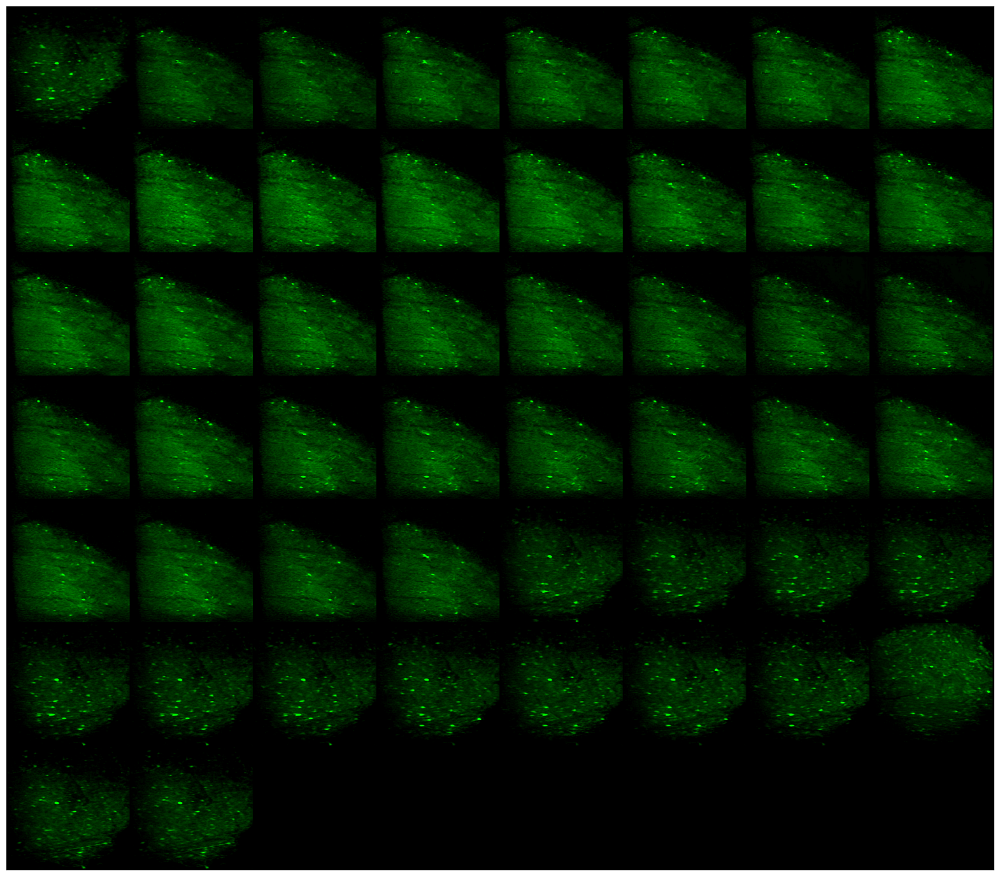

In [14]:
H_lerp = torch.tensor(H_lerp).type(torch.float).to(device) 

lerp_sample = sample(start_latents=H_lerp[i], num_inference_steps=inf_steps, 
                     labels=labels_test[i], noise_scheduler=noise_scheduler, netLDM=netLDM, 
                     start_step=0, device=device)

lerp_sample = (1 / 0.18215) * lerp_sample[-1]
with torch.no_grad():
    lerp_sample = vae.decode(lerp_sample).sample 

show_images(lerp_sample)

  0%|          | 0/999 [00:00<?, ?it/s]

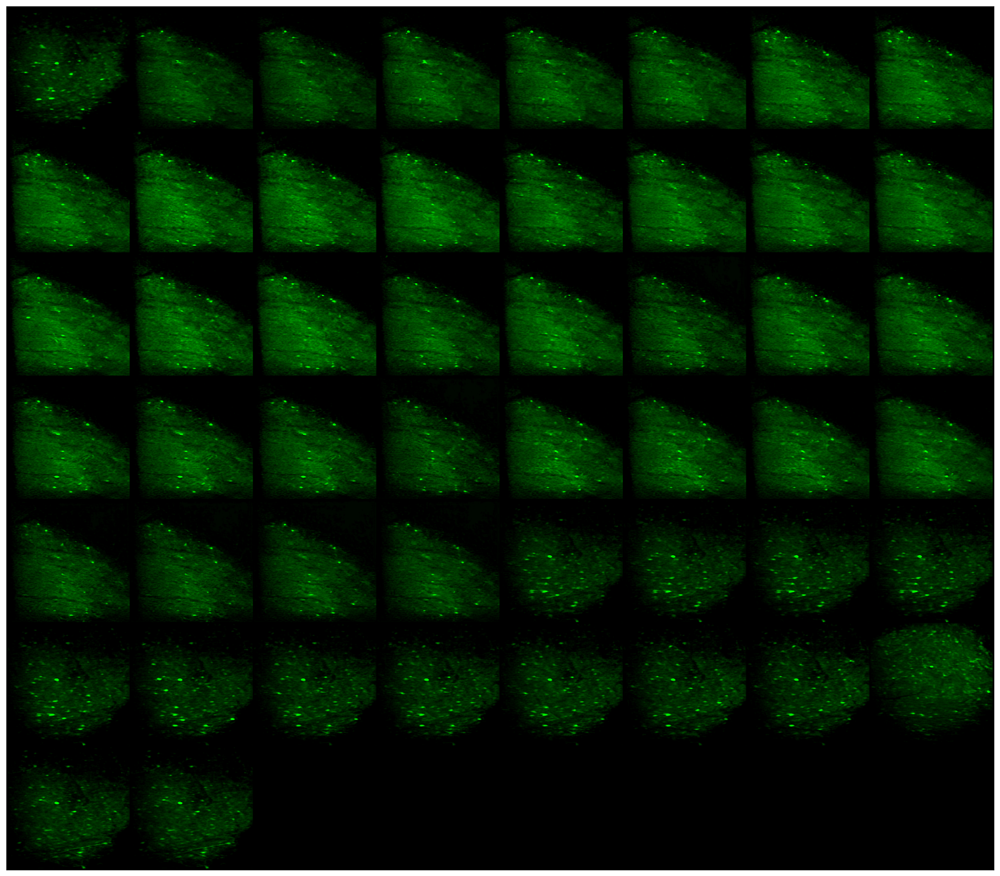

In [15]:
H_slerp = torch.tensor(H_slerp).type(torch.float).to(device) 
slerp_sample = sample(start_latents=H_slerp[i], num_inference_steps=inf_steps, 
                     labels=labels_test[i], noise_scheduler=noise_scheduler, netLDM=netLDM, 
                     start_step=0, device=device)

slerp_sample = (1 / 0.18215) * slerp_sample[-1]
with torch.no_grad():
    slerp_sample = vae.decode(slerp_sample).sample 

show_images(slerp_sample)    

  0%|          | 0/999 [00:00<?, ?it/s]

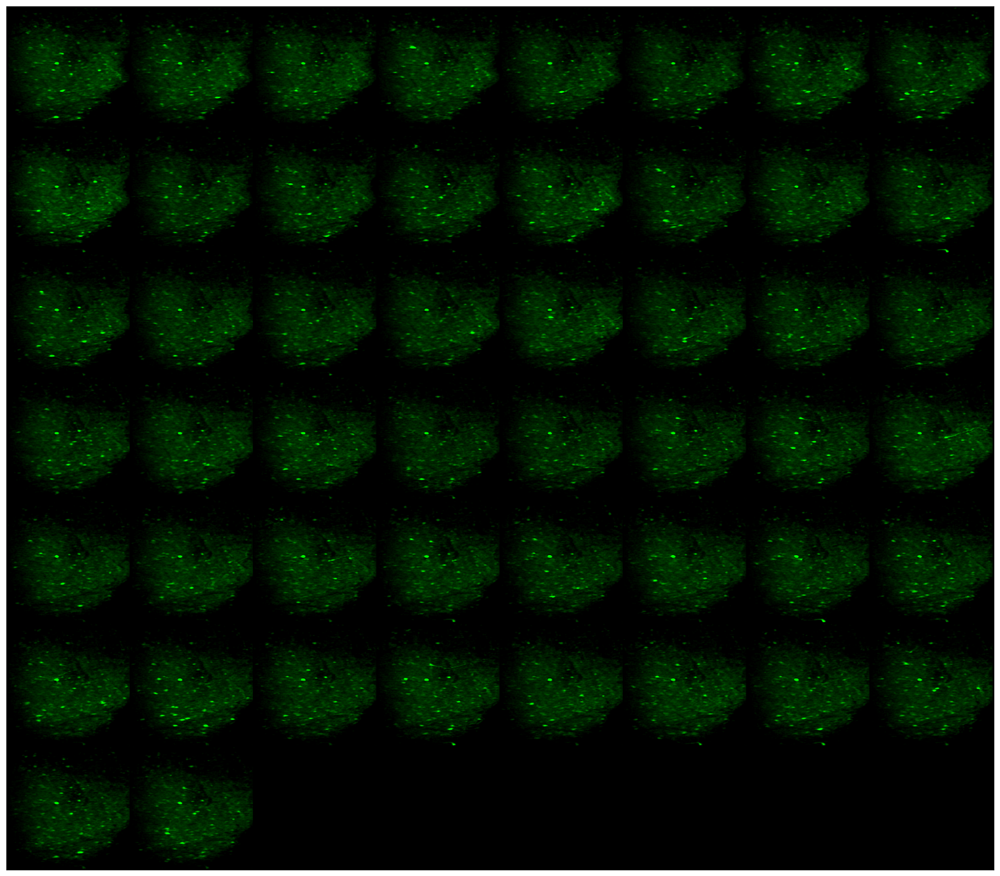

In [16]:
H_lstm = torch.tensor(H_lstm).type(torch.float).to(device) 
lstm_sample = sample(start_latents=H_lstm[i].to(device), num_inference_steps=inf_steps, 
                     labels=labels_test[i], noise_scheduler=noise_scheduler, netLDM=netLDM, 
                     start_step=0, device=device)

lstm_sample = (1 / 0.18215) * lstm_sample[-1]
with torch.no_grad():
    lstm_sample = vae.decode(lstm_sample).sample 

show_images(lstm_sample)     

  0%|          | 0/999 [00:00<?, ?it/s]

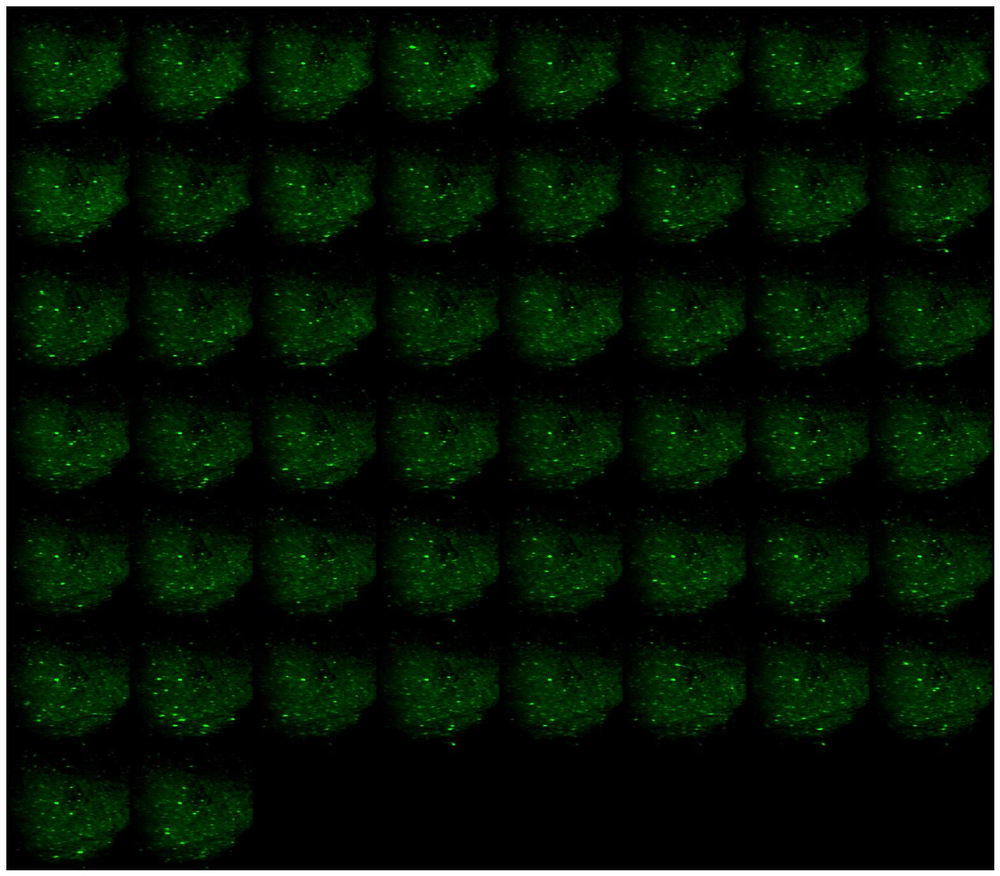

In [17]:
H_tex1 = torch.tensor(H_tex1).type(torch.float).to(device) 
tex1_sample = sample(start_latents=H_tex1[i].to(device), num_inference_steps=inf_steps, 
                     labels=labels_test[i], noise_scheduler=noise_scheduler, netLDM=netLDM, 
                     start_step=0, device=device)

tex1_sample = (1 / 0.18215) * tex1_sample[-1]
with torch.no_grad():
    tex1_sample = vae.decode(tex1_sample).sample 

show_images(tex1_sample)  

  0%|          | 0/999 [00:00<?, ?it/s]

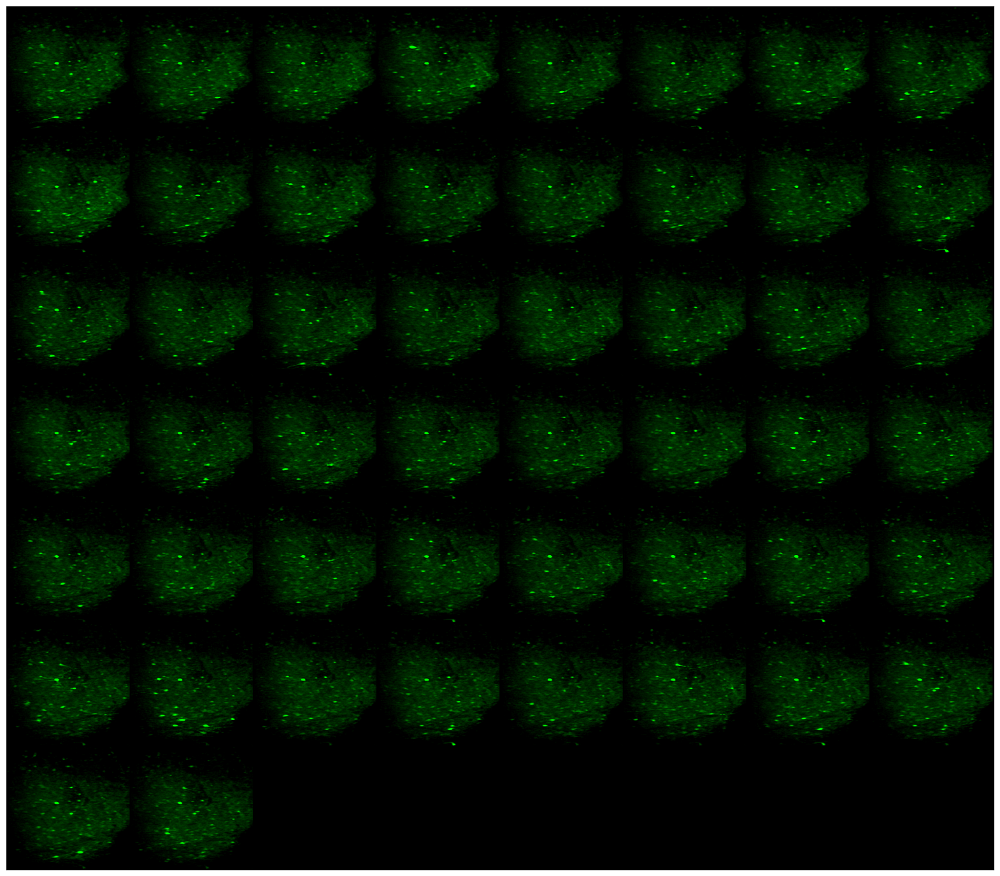

In [18]:
H_tex2 = torch.tensor(H_tex2).type(torch.float).to(device) 
tex2_sample = sample(start_latents=H_tex2[i].to(device), num_inference_steps=inf_steps, 
                     labels=labels_test[i], noise_scheduler=noise_scheduler, netLDM=netLDM, 
                     start_step=0, device=device)

tex2_sample = (1 / 0.18215) * tex2_sample[-1]
with torch.no_grad():
    tex2_sample = vae.decode(tex2_sample).sample 

show_images(tex2_sample)  

  0%|          | 0/999 [00:00<?, ?it/s]

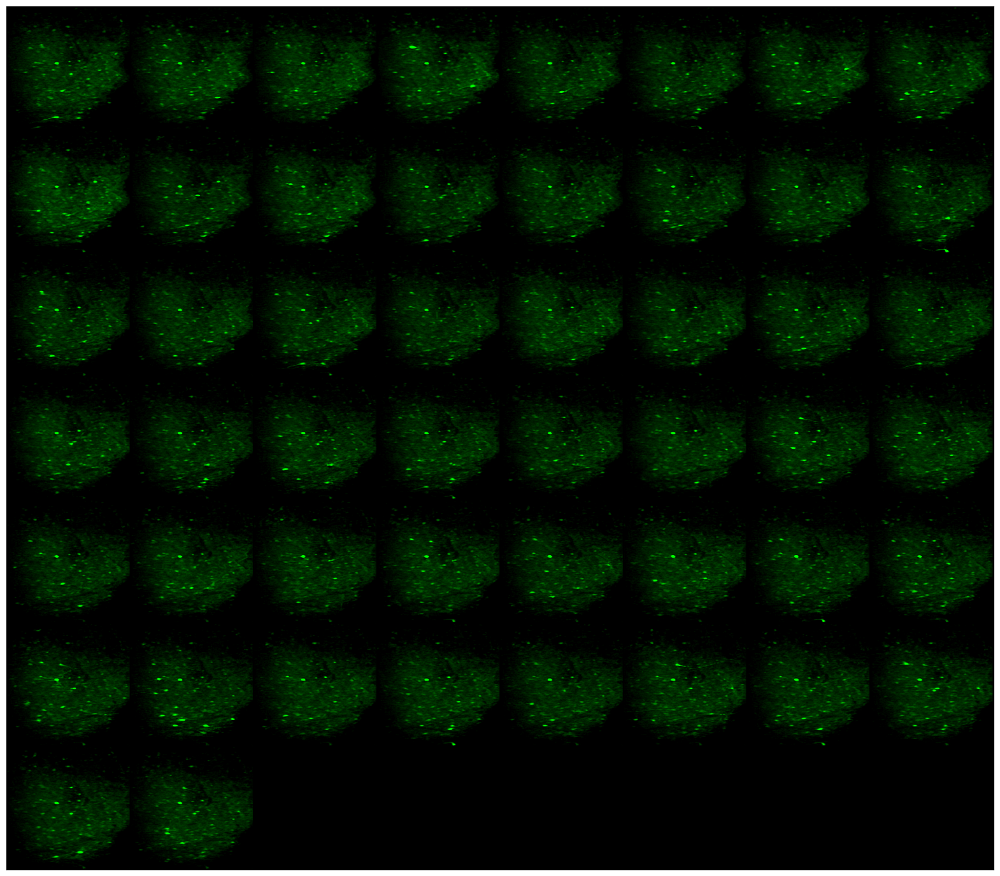

In [19]:
H_spline = torch.tensor(H_spline).type(torch.float).to(device) 
spline_sample = sample(start_latents=H_spline[i].to(device), num_inference_steps=inf_steps, 
                     labels=labels_test[i], noise_scheduler=noise_scheduler, netLDM=netLDM, 
                     start_step=0, device=device)

spline_sample = (1 / 0.18215) * spline_sample[-1]
with torch.no_grad():
    spline_sample = vae.decode(spline_sample).sample 

show_images(spline_sample)  

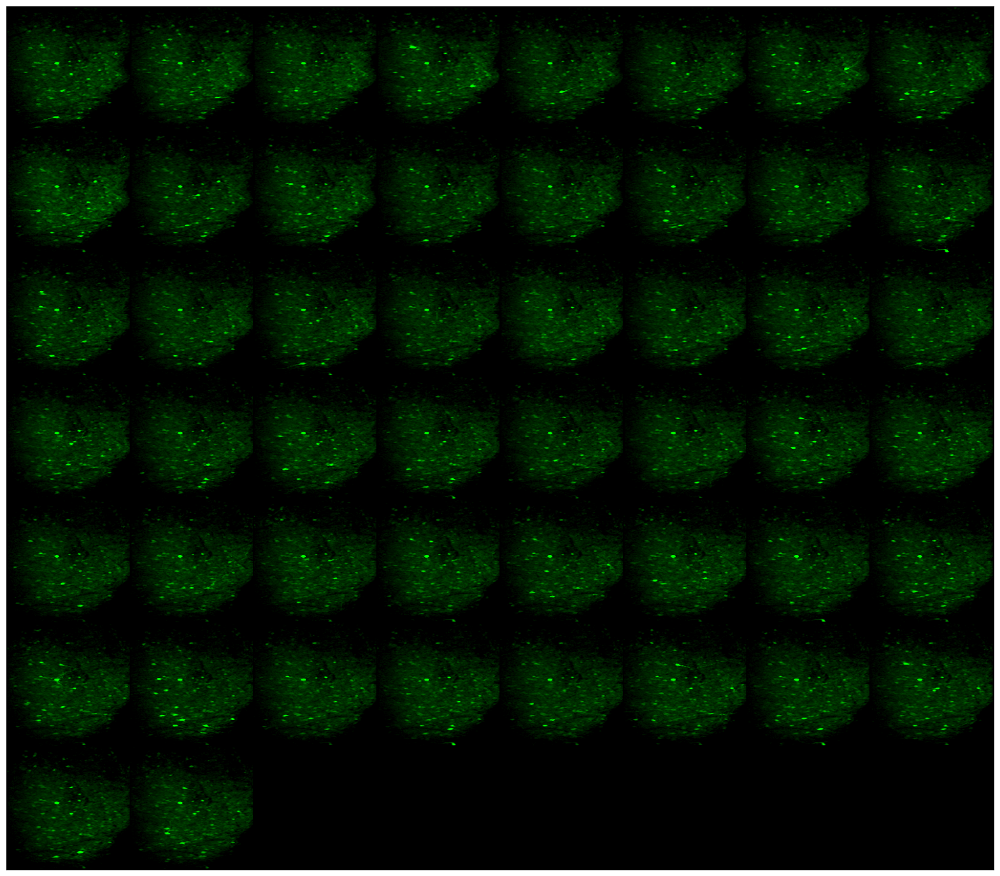

In [20]:
show_images(real_images)